# Analysis of PM Lee's COVID-19 Speeches

## Extraction of Key Phrases

### 1. Import modules

In [1]:
import pandas as pd
import nltk
from nltk.corpus import stopwords
from nltk import word_tokenize
from multi_rake import Rake
# import bar_chart_race as bcr

In [12]:
df = pd.read_csv('../Data/pm_lee_covid_speeches.csv')
df['date'] = df['title'].str.extract(r'(\d{1,2}\s\w+\s202[0-2])')
df['date'] = pd.to_datetime(df['date'])
df

,title,speech,date
0,PM Lee Hsien Loong on the COVID-19 situation i...,\nWe have faced the new coronavirus (nCoV) sit...,2020-02-08
1,PM Lee Hsien Loong on the COVID-19 situation i...,"\nMy fellow Singaporeans, good evening.\n\nFiv...",2020-03-12
2,PM Lee Hsien Loong on the COVID-19 situation i...,\n\nMy fellow Singaporeans\nGood afternoon\n\n...,2020-04-03
3,PM Lee Hsien Loong on the COVID-19 situation i...,\n\nMy fellow Singaporeans\n\nI spoke to you o...,2020-04-10
4,PM Lee Hsien Loong on the COVID-19 situation i...,\nFellow Singaporeans & Residents\n\nI am spea...,2020-04-21
5,National Broadcast by PM Lee Hsien Loong on 7 ...,\nMy fellow Singaporeans\n\nGood evening\n\nOu...,2020-06-07
6,PM Lee Hsien Loong on the COVID-19 situation i...,\nMy fellow Singaporeans\n\nWe are coming to a...,2020-12-14
7,PM Lee Hsien Loong on the COVID-19 'New Normal...,\nMy fellow Singaporeans\n\nFor the last three...,2021-05-31
8,Update on the COVID-19 Situation in Singapore ...,"\nProtect the Vulnerable, Secure our Future\nM...",2021-10-09
9,Speech by PM Lee Hsien Loong on COVID-19: A Ne...,"\nMy fellow Singaporeans,\n\nOur fight against...",2022-03-24


PM Lee Hsien Loong on the COVID-19 situation in Singapore on 8 February 2020


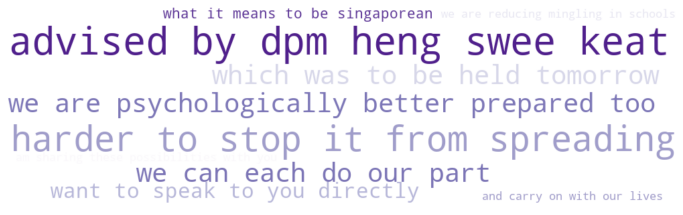

Wordcloud saved to ../Images/phrasecloud_2020-02-08.png

PM Lee Hsien Loong on the COVID-19 situation in Singapore on 12 March 2020


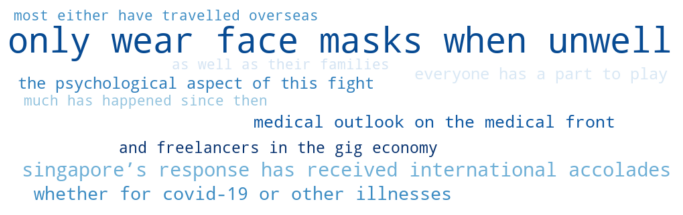

Wordcloud saved to ../Images/phrasecloud_2020-03-12.png

PM Lee Hsien Loong on the COVID-19 situation in Singapore on 3 April 2020


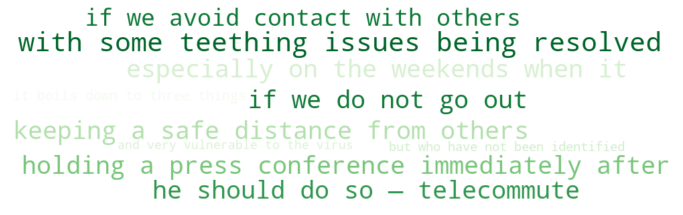

Wordcloud saved to ../Images/phrasecloud_2020-04-03.png

PM Lee Hsien Loong on the COVID-19 situation in Singapore on 10 April 2020


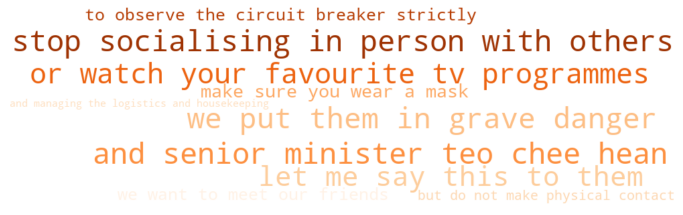

Wordcloud saved to ../Images/phrasecloud_2020-04-10.png

PM Lee Hsien Loong on the COVID-19 situation in Singapore on 21 April 2020


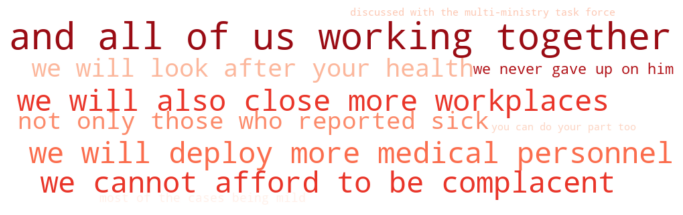

Wordcloud saved to ../Images/phrasecloud_2020-04-21.png

National Broadcast by PM Lee Hsien Loong on 7 June 2020


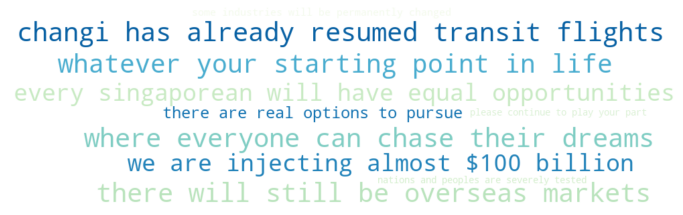

Wordcloud saved to ../Images/phrasecloud_2020-06-07.png

PM Lee Hsien Loong on the COVID-19 situation in Singapore on 14 December 2020


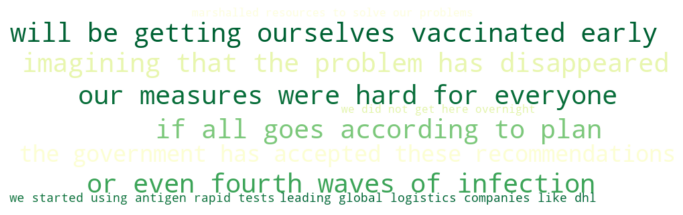

Wordcloud saved to ../Images/phrasecloud_2020-12-14.png

PM Lee Hsien Loong on the COVID-19 'New Normal' on 31 May 2021


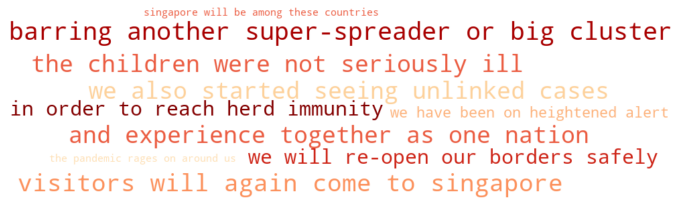

Wordcloud saved to ../Images/phrasecloud_2021-05-31.png

Update on the COVID-19 Situation in Singapore by PM Lee Hsien Loong on 9 October 2021


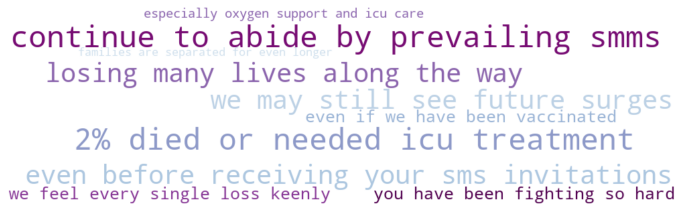

Wordcloud saved to ../Images/phrasecloud_2021-10-09.png

Speech by PM Lee Hsien Loong on COVID-19: A New Phase on 24 Mar 2022


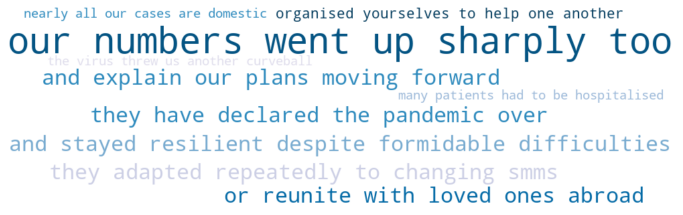

Wordcloud saved to ../Images/phrasecloud_2022-03-24.png



In [48]:
colormap_list = ['Purples', 'Blues', 'Greens', 'Oranges', 'Reds', 'GnBu', 'YlGn', 'OrRd', 'BuPu', 'PuBu']
for row in df.itertuples():
    speech = row.speech
    date = row.date
    print(row.title)
    rake = Rake(max_words=6, stopwords='english')
    top_keyphrases = rake.apply(speech)[:10]
    wc = WordCloud(width=1000, height=300, prefer_horizontal=1, relative_scaling=1, 
                   colormap=colormap_list[row.Index], max_font_size=80, min_font_size=10, 
                   background_color='white', random_state=999)
    wc.generate_from_frequencies({i:k for i, k in top_keyphrases})
    plt.figure(figsize=(12,8))
    plt.imshow(wc, interpolation='bilinear')
    plt.axis("off")
    plt.show()
    filename = "../Images/phrasecloud_" + str(date).split()[0] + ".png"
    wc.to_file(filename)
    print(f"Wordcloud saved to {filename}")
    print()

In [ ]:
from wordcloud import WordCloud
import math
import matplotlib.pyplot as plt
from multi_rake import Rake


rake = Rake(max_words=6, min_chars=5, stopwords='english')
top_10 = rake.apply(df.loc[1, 'speech'])[:12]
wc = WordCloud(
               prefer_horizontal=1, width=1000, height=400, 
               max_font_size=80, min_font_size=4, colormap="OrRd", 
               relative_scaling=1, 
               random_state=111, 
#                background_color="white").generate_from_frequencies({i:math.exp(k) for i, k in top_10})
               background_color="white").generate_from_frequencies({i:k for i, k in top_10})

plt.figure(figsize=(10,6))
plt.imshow(wc, interpolation='bilinear')
plt.axis("off")
plt.show()
# name = "word_plot_" + str(i)
# wc.to_file("pic1.png")

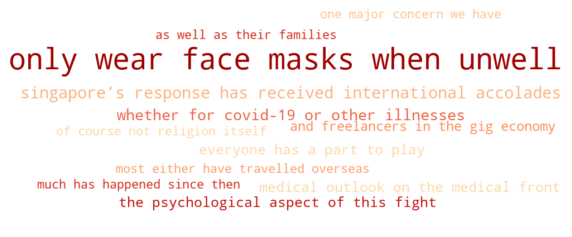

In [7]:
from wordcloud import WordCloud
import math
import matplotlib.pyplot as plt
from multi_rake import Rake

rake = Rake(max_words=6, min_chars=5, stopwords='english')
top_10 = rake.apply(df.loc[1, 'speech'])[:12]
# top_10
wc = WordCloud(
#     font_path='ITCKRIST.ttf', 
               prefer_horizontal=1, width=1000, height=400, 
               max_font_size=80, min_font_size=4, colormap="OrRd", 
               relative_scaling=1, 
               random_state=111, 
#                background_color="white").generate_from_frequencies({i:math.exp(k) for i, k in top_10})
               background_color="white").generate_from_frequencies({i:k for i, k in top_10})

plt.figure(figsize=(10,6))
plt.imshow(wc, interpolation='bilinear')
plt.axis("off")
plt.show()
# name = "word_plot_" + str(i)
# wc.to_file("pic1.png")

In [6]:
# rake = Rake(max_words=6, min_chars=5, stopwords='english')
# top_10 = rake.apply(df.loc[9, 'speech'])[:10]
# top_10

In [3]:
# def remove_punct(text):

#     """This function takes a text string as input and returns the same text string without specified punctuation marks."""
    
#     # Specify punctuation marks to remove from text string
#     punctuation = "``±!@#$%^&*()+?:;”“’<>.,-—" 

#     # Loop through the text to remove specified punctuations
#     for c in text:
#         if c in punctuation:
#             text = text.replace(c, "")

#     return text


# def pre_process(text):
#     lemmatizer = nltk.stem.WordNetLemmatizer()
    
#     text = remove_punct(text)
#     text = text.replace("\n", " ")
#     text = text.lower()
# #     word_list = [word for word in word_tokenize(text) if not word in set(stopwords.words('english'))]
#     word_list = [word for word in word_tokenize(text)]

# #     word_list = [lemmatizer.lemmatize(word) for word in word_tokenize(text) if not word in set(stopwords.words('english'))]
#     return ' '.join(word_list)

# t = df.loc[0, 'speech']
# t = pre_process(t)
# t

In [4]:
# df['text_processed'] = df['speech'].apply(lambda x: pre_process(x))
# df

In [ ]:
rake = Rake()
keywords = rake.apply(df.loc[idx, 'speech'])

In [90]:
from multi_rake import Rake
d = pd.DataFrame()
for idx in range(len(df)):
    rake = Rake()
    keywords = rake.apply(df.loc[idx, 'speech'])
    df1 = pd.DataFrame(keywords[:10])
    if idx == 0:
        d = df1
    else:
        d = pd.merge(d, df1, how='outer', on=0)
    
d2 = d.T
d2.columns = d2.loc[0]
d2 = d2[1:]
d2.reset_index(drop=True, inplace=True)
d2 = pd.concat([d2, df['date']], axis=1)
d2.set_index('date', inplace=True)
d2.fillna(0, inplace=True)
# d2.reset_index(inplace=True)
d2

,ministerial task force,personal protective equipment,advanced research capabilities,large public events,observe personal hygiene,natural human reactions,team nila volunteers,stockpiled adequate supplies,avoid crowded places,quarantined close contacts,...,highest vaccination rates,plans moving forward,made tremendous sacrifices,drastically streamline testing,solidarity remains crucial,everyone’s collective effort,‘freedom day’ approach,enjoy larger gatherings,social responsibility —,protect singaporeans’ livelihoods
date,,,,,,,,,,,,,,,,,,,,,
2020-02-08,9.0,9.0,9.0,9.0,9.0,9.0,9.0,8.5,8.5,8.333333,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2020-03-12,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2020-04-03,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2020-04-10,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2020-04-21,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2020-06-07,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2020-12-14,9.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2021-05-31,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2021-10-09,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,...,8.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [6]:
bcr.bar_chart_race(
    df=d2,
    steps_per_period=30,
    n_bars=10,
    fixed_order=False,
    fig_kwargs={
        'figsize': (26, 15),
        'dpi': 120,
        'facecolor': '#F8FAFF'
    },
    period_length=4000,
    end_period_pause=750,
    title={
        'label': "Key Phrases from PM Lee's COVID-19 Speeches",
        'size': 52,
        'weight': 'bold',
        'pad': 40
    },
    bar_size=0.8,
    period_label={
        'x': 0.95, 
        'y': 0.15,
        'ha': 'right',
        'va': 'center',
        'size': 30,
        'weight': 'semibold'
    },
    bar_label_font={
        'size': 27
    },
    period_template="%B %d %Y",
    tick_label_font={
        'size': 27
    },
    bar_kwargs={
        'alpha': 0.99,
        'lw': 0
    },
    colors='Blues',
#     filename="../video.mp4"
)

In [15]:
bcr.bar_chart_race?

In [20]:
# from summa import summarizer

In [36]:
# print(summarizer.summarize(df.loc[9, 'speech'], ratio=0.2, scores=True))

In [23]:
# help(summarizer.summarize)

Help on function summarize in module summa.summarizer:

summarize(text, ratio=0.2, words=None, language='english', split=False, scores=False, additional_stopwords=None)



In [69]:
# df['speech'].str.len()
# df['text_processed'].str.len()

In [71]:
docs = df['text_processed'].tolist()
# docs

In [72]:
from sklearn.feature_extraction.text import CountVectorizer

In [73]:
cv = CountVectorizer(max_df=0.85)
word_count_vector = cv.fit_transform(docs)
word_count_vector

<10x2458 sparse matrix of type '<class 'numpy.int64'>'
	with 4853 stored elements in Compressed Sparse Row format>

In [76]:
list(cv.vocabulary_.keys())[:10]

['faced',
 'coronavirus',
 'ncov',
 'ministerial',
 'task',
 'force',
 'advised',
 'dpm',
 'heng',
 'swee']

In [77]:
from sklearn.feature_extraction.text import TfidfTransformer

In [ ]:
tfidf_transformer = TfidfTransformer(smooth_idf=True, use_idf=True)
tfidf_transformer.fit(word_count_vector)

In [78]:
from sklearn.feature_extraction.text import TfidfVectorizer
vectorizer = TfidfVectorizer(use_idf=True, max_df=0.5, min_df=1, ngram_range=(1,3))
vectors = vectorizer.fit_transform(df['text_processed'])
vectors

<10x19294 sparse matrix of type '<class 'numpy.float64'>'
	with 21662 stored elements in Compressed Sparse Row format>

In [80]:
dict_of_tokens = {i[1]:i[0] for i in vectorizer.vocabulary_.items()}
# dict_of_tokens

In [182]:
# tfidf_vectors = []  # all deoc vectors by tfidf
# for row in vectors:
#     tfidf_vectors.append({dict_of_tokens[column]:value for (column,value) in zip(row.indices,row.data)})


In [181]:
# print("The number of document vectors = ", len(tfidf_vectors), "\nThe dictionary of document[0]: ", tfidf_vectors[0])

In [180]:
# doc_sorted_tfidfs =[]  # list of doc features each with tfidf weight
# #sort each dict of a document
# for dn in tfidf_vectors:
#     newD = sorted(dn.items(), key=lambda x: x[1], reverse=True)
#     newD = dict(newD)
#     doc_sorted_tfidfs.append(newD)
    
# doc_sorted_tfidfs

RAKE

In [207]:
# 'chief guards officer' in df.loc[3, 'speech'].lower()
# print(df.loc[3, 'speech'])

In [53]:
help(Rake)

Help on class Rake in module rake_nltk.rake:

class Rake(builtins.object)
 |  Rake(stopwords: Union[Set[str], NoneType] = None, punctuations: Union[Set[str], NoneType] = None, language: str = 'english', ranking_metric: rake_nltk.rake.Metric = <Metric.DEGREE_TO_FREQUENCY_RATIO: 0>, max_length: int = 100000, min_length: int = 1, include_repeated_phrases: bool = True, sentence_tokenizer: Union[Callable[[str], List[str]], NoneType] = None, word_tokenizer: Union[Callable[[str], List[str]], NoneType] = None)
 |  
 |  Rapid Automatic Keyword Extraction Algorithm.
 |  
 |  Methods defined here:
 |  
 |  __init__(self, stopwords: Union[Set[str], NoneType] = None, punctuations: Union[Set[str], NoneType] = None, language: str = 'english', ranking_metric: rake_nltk.rake.Metric = <Metric.DEGREE_TO_FREQUENCY_RATIO: 0>, max_length: int = 100000, min_length: int = 1, include_repeated_phrases: bool = True, sentence_tokenizer: Union[Callable[[str], List[str]], NoneType] = None, word_tokenizer: Union[Cal

In [88]:
from gensim.summarization import keywords

ModuleNotFoundError: No module named 'gensim.summarization'

In [89]:
import gensim

In [ ]:
gensim.

In [87]:
from rake_nltk import Rake
r = Rake(max_length=4, include_repeated_phrases=False)
r.extract_keywords_from_text(df.loc[6, 'speech'])
r.get_ranked_phrases_with_scores()

[(16.0, 'sign advance purchase agreements'),
 (16.0, 'minus 70 degrees celsius'),
 (15.0, 'introduced rostered routine testing'),
 (14.0, 'international air transport association'),
 (14.0, 'establish vaccine manufacturing capabilities'),
 (13.0, 'public places like malls'),
 (12.5, 'two weeks ’ time'),
 (11.7, 'also supported local efforts'),
 (10.6, '19 vaccines become available'),
 (9.0, 'working quietly behind'),
 (9.0, 'visit someone ’'),
 (9.0, 'systematically creating opportunities'),
 (9.0, 'resume larger gatherings'),
 (9.0, 'placed multiple bets'),
 (9.0, 'ministerial task force'),
 (9.0, 'health sciences authority'),
 (9.0, 'could gradually ease'),
 (9.0, 'always planned ahead'),
 (8.75, 'global economic dislocation'),
 (8.666666666666666, 'transport pharmaceutical supplies'),
 (8.5, 'vaccinations become widespread'),
 (8.5, 'us permanently losing'),
 (8.5, 'steps forward later'),
 (8.5, 'ground handling partners'),
 (8.5, 'especially seniors like'),
 (8.5, 'ease capacity li

In [18]:
help(Rake)

Help on class Rake in module multi_rake.algorithm:

class Rake(builtins.object)
 |  Rake(min_chars=3, max_words=3, min_freq=1, language_code=None, stopwords=None, lang_detect_threshold=50, max_words_unknown_lang=2, generated_stopwords_percentile=80, generated_stopwords_max_len=3, generated_stopwords_min_freq=2)
 |  
 |  Methods defined here:
 |  
 |  __init__(self, min_chars=3, max_words=3, min_freq=1, language_code=None, stopwords=None, lang_detect_threshold=50, max_words_unknown_lang=2, generated_stopwords_percentile=80, generated_stopwords_max_len=3, generated_stopwords_min_freq=2)
 |      Initialize self.  See help(type(self)) for accurate signature.
 |  
 |  apply(self, text, text_for_stopwords=None)
 |  
 |  ----------------------------------------------------------------------
 |  Data descriptors defined here:
 |  
 |  __dict__
 |      dictionary for instance variables (if defined)
 |  
 |  __weakref__
 |      list of weak references to the object (if defined)



In [97]:
help(Rake)

Help on class Rake in module multi_rake.algorithm:

class Rake(builtins.object)
 |  Rake(min_chars=3, max_words=3, min_freq=1, language_code=None, stopwords=None, lang_detect_threshold=50, max_words_unknown_lang=2, generated_stopwords_percentile=80, generated_stopwords_max_len=3, generated_stopwords_min_freq=2)
 |  
 |  Methods defined here:
 |  
 |  __init__(self, min_chars=3, max_words=3, min_freq=1, language_code=None, stopwords=None, lang_detect_threshold=50, max_words_unknown_lang=2, generated_stopwords_percentile=80, generated_stopwords_max_len=3, generated_stopwords_min_freq=2)
 |      Initialize self.  See help(type(self)) for accurate signature.
 |  
 |  apply(self, text, text_for_stopwords=None)
 |  
 |  ----------------------------------------------------------------------
 |  Data descriptors defined here:
 |  
 |  __dict__
 |      dictionary for instance variables (if defined)
 |  
 |  __weakref__
 |      list of weak references to the object (if defined)



In [133]:
from collections import Counter
Counter(['a', 'b', 'c', 'd', 'a', 'c'])

Counter({'a': 2, 'b': 1, 'c': 2, 'd': 1})

In [253]:
from multi_rake import Rake
rake = Rake(max_words=3)

all_phrases = []
d = {}

for idx in range(len(df)):
    keywords = rake.apply(df.loc[idx, 'speech'])
#     print(keywords[:10])
#     print()
    
    for phrase, score in keywords[:5]:
        print(phrase, score)
        
        if phrase in all_phrases:
            print("***", phrase)
            d[phrase] = round(score, 1)
        
        else:
            d[phrase] = round(score, 1)
            all_phrases.append(phrase)
#         if item[0] not in col:
#             col.append(item[0])
#         else:
            
    print()
pd.DataFrame(d, index=[0])
# print(all_phrases)
# print(len(all_phrases))

ministerial task force 9.0
personal protective equipment 9.0
advanced research capabilities 9.0
large public events 9.0
observe personal hygiene 9.0

kuala lumpur recently 9.0
saint peter’s square 9.0
high blood pressure 9.0
create additional capacity 9.0
made direct appeals 9.0

pre-empt escalating infections 9.0
press conference immediately 9.0
disrupt economic sectors 9.0
global supply chain 9.0
social distancing extremely 9.0

chief guards officer 9.0
public service agencies 9.0
favourite tv programmes 9.0
foreign worker dormitories 8.5
paying close attention 8.5

active treatment receive 9.0
maintaining key infrastructure 9.0
remained largely contained 9.0
multi-ministry task force 9.0
popular wet markets 9.0

contact tracing significantly 9.0
outbreak remains firmly 9.0
maintain personal hygiene 9.0
largest fiscal intervention 9.0
quick weekend trips 9.0

antigen rapid tests 9.0
resume larger gatherings 9.0
ministerial task force 9.0
*** ministerial task force
visit someone’s hom

,ministerial task force,personal protective equipment,advanced research capabilities,large public events,observe personal hygiene,kuala lumpur recently,saint peter’s square,high blood pressure,create additional capacity,made direct appeals,...,complicated flow charts,secured vaccine supplies,needed icu treatment,needed oxygen supplementation,badly needed beds,plans moving forward,migrant worker dormitories,made tremendous sacrifices,drastically streamline testing,solidarity remains crucial
0,9.0,9.0,9.0,9.0,9.0,9.0,9.0,9.0,9.0,9.0,...,9.0,8.5,8.5,8.5,8.5,9.0,9.0,9.0,9.0,9.0


In [241]:
col = []
d = {}
for item in keywords[:30]:
    d[item[0]] = round(item[1], 1)
    
pd.DataFrame(d, index=[0])

,ministerial task force,personal protective equipment,advanced research capabilities,large public events,observe personal hygiene,natural human reactions,team nila volunteers,stockpiled adequate supplies,avoid crowded places,quarantined close contacts,...,ample supplies,avoid touching,extra mile,government’s response,lie ahead,medical facilities,national centre,trained doctors,important differences,hubei province
0,9.0,9.0,9.0,9.0,9.0,9.0,9.0,8.5,8.5,8.3,...,4.5,4.5,4.5,4.0,4.0,4.0,4.0,4.0,4.0,4.0


In [ ]:
data = {'col_1': [3, 2, 1, 0], 'col_2': ['a', 'b', 'c', 'd']}
pd.DataFrame.from_dict(data)

In [220]:
len(keywords)

232

In [231]:
# pd.DataFrame(keywords)
# .pivot(columns=0, values=1)

,0,1
0,pre-empt escalating infections,9.0
1,press conference immediately,9.0
2,disrupt economic sectors,9.0
3,global supply chain,9.0
4,social distancing extremely,9.0
...,...,...
227,transmission,1.0
228,protect,1.0
229,seniors,1.0
230,ill,1.0


In [135]:
help(Rake)

Help on class Rake in module multi_rake.algorithm:

class Rake(builtins.object)
 |  Rake(min_chars=3, max_words=3, min_freq=1, language_code=None, stopwords=None, lang_detect_threshold=50, max_words_unknown_lang=2, generated_stopwords_percentile=80, generated_stopwords_max_len=3, generated_stopwords_min_freq=2)
 |  
 |  Methods defined here:
 |  
 |  __init__(self, min_chars=3, max_words=3, min_freq=1, language_code=None, stopwords=None, lang_detect_threshold=50, max_words_unknown_lang=2, generated_stopwords_percentile=80, generated_stopwords_max_len=3, generated_stopwords_min_freq=2)
 |      Initialize self.  See help(type(self)) for accurate signature.
 |  
 |  apply(self, text, text_for_stopwords=None)
 |  
 |  ----------------------------------------------------------------------
 |  Data descriptors defined here:
 |  
 |  __dict__
 |      dictionary for instance variables (if defined)
 |  
 |  __weakref__
 |      list of weak references to the object (if defined)



TextRank

In [7]:
from summa import keywords

In [10]:
TR_keywords = keywords.keywords(df.loc[9, 'text_processed'], scores=True)
print(TR_keywords[0:30])

[('vaccinated', 0.25669285768528444), ('vaccine', 0.25669285768528444), ('national vaccination', 0.16524913024104815), ('measured', 0.15530956660634335), ('worker', 0.14826828619989388), ('day', 0.12780738507325512), ('days', 0.12780738507325512), ('personal', 0.1277279382576701), ('persons', 0.1277279382576701), ('healthcare workers', 0.12357675383955978), ('omicron', 0.12031590167696163), ('omicrons', 0.12031590167696163), ('travel', 0.11767319455808717), ('travellers', 0.11767319455808717), ('safely', 0.11585231833789875), ('safe', 0.11585231833789875), ('case', 0.11543488740626555), ('majority', 0.11512141155409399), ('new wave', 0.11460524879995568), ('stringent measures', 0.11021109799634583), ('covid', 0.10495037120292663), ('singapore', 0.10317822334782623), ('needed', 0.10244668970594697), ('need', 0.10244668970594697), ('needing', 0.10244668970594697), ('singaporeans', 0.10108406339810219), ('testing', 0.10074419998950596), ('test', 0.10074419998950596), ('major turning', 0.1

In [11]:
TR_keywords = keywords.keywords(df.loc[0, 'text_processed'], scores=True)
print(TR_keywords[0:30])

[('new coronavirus', 0.1488535110743993), ('rate', 0.1319578508138602), ('public', 0.12935824812954227), ('sars', 0.12932288305891157), ('stay', 0.12460873921116708), ('stays', 0.12460873921116708), ('diseases', 0.12242822818640131), ('disease', 0.12242822818640131), ('years', 0.11892805872770966), ('year', 0.11892805872770966), ('like', 0.11507287137625435), ('contact', 0.1140620500415998), ('contacts', 0.1140620500415998), ('medical', 0.1140620500415991), ('personal', 0.10461971709047012), ('extra precautions', 0.10243562489776496), ('food', 0.10158091687179072), ('helped', 0.1014350481686973), ('help', 0.1014350481686973), ('helping', 0.1014350481686973), ('workers', 0.10046992003091011), ('virus', 0.09737632865826587), ('way', 0.09311442707134769), ('seasonal', 0.09311442707134765), ('confining', 0.09311442707134734), ('confined', 0.09311442707134734), ('time', 0.09311442707134725), ('research', 0.09311442707134712), ('singaporeans', 0.09311442707134711), ('singaporean', 0.09311442

In [178]:
TR_keywords = keywords.keywords(df.loc[9, 'text_processed'], scores=True)
print(TR_keywords[0:30])

[('vaccinated', 0.24565986293593872), ('vaccine', 0.24565986293593872), ('national vaccination', 0.15895033493115093), ('worker', 0.1480505496026945), ('measured', 0.14578678110738694), ('covid', 0.1379070035544217), ('personal', 0.12750910148147382), ('persons', 0.12750910148147382), ('day', 0.1262742767153898), ('days', 0.1262742767153898), ('needed', 0.12528565060243532), ('need', 0.12528565060243532), ('needing', 0.12528565060243532), ('healthcare workers', 0.12339527752683288), ('omicron', 0.11973949163239495), ('omicrons', 0.11973949163239495), ('majority', 0.11491495644636918), ('safely', 0.11469439605914179), ('safe', 0.11469439605914179), ('travel', 0.11344448861100938), ('travellers', 0.11344448861100938), ('new wave', 0.11324489918823424), ('testing', 0.11305903597467334), ('test', 0.11305903597467334), ('case', 0.11040607800353987), ('stringent measures', 0.10442216182349584), ('singapore', 0.10254843721482261), ('major turning', 0.10004616478597864), ('singaporeans', 0.099

In [168]:
TR_keywords = keywords.keywords(df.loc[9, 'speech'], deaccent=True, scores=True)
print(TR_keywords[0:30])

[('vaccinated', 0.2475221539865503), ('vaccine', 0.2475221539865503), ('national vaccination', 0.1601561675153647), ('worker', 0.14917952228556874), ('measures', 0.14689201760477072), ('measured', 0.14689201760477072), ('covid', 0.13894791912910842), ('new', 0.12914126949785804), ('personal', 0.1284812292911113), ('persons', 0.1284812292911113), ('day', 0.1272284038515296), ('days', 0.1272284038515296), ('needed', 0.12623963525949566), ('need', 0.12623963525949566), ('needing', 0.12623963525949566), ('healthcare workers', 0.12433623923144828), ('majority', 0.1156438027397464), ('safely', 0.11556832043566007), ('safe', 0.11556832043566007), ('travel', 0.1142871454920944), ('travellers', 0.1142871454920944), ('tested', 0.113921177746588), ('testing', 0.113921177746588), ('test', 0.113921177746588), ('case', 0.11121670107137734), ('singapore', 0.10332993531769606), ('major turning', 0.10056707464288946), ('singaporeans', 0.10018546866430139), ('omicron', 0.09923042222372601), ('wave', 0.0

In [169]:
keywords.keywords?

In [171]:
keywords.get_graph(df.loc[9, 'speech'])

In [103]:
help(keywords.keywords)

Help on function keywords in module summa.keywords:

keywords(text, ratio=0.2, words=None, language='english', split=False, scores=False, deaccent=False, additional_stopwords=None)



In [12]:
from keybert import KeyBERT

In [13]:
kw_model = KeyBERT(model='all-mpnet-base-v2')

In [108]:
help(KeyBERT.extract_keywords)

Help on function extract_keywords in module keybert._model:

extract_keywords(self, docs: Union[str, List[str]], candidates: List[str] = None, keyphrase_ngram_range: Tuple[int, int] = (1, 1), stop_words: Union[str, List[str]] = 'english', top_n: int = 5, min_df: int = 1, use_maxsum: bool = False, use_mmr: bool = False, diversity: float = 0.5, nr_candidates: int = 20, vectorizer: sklearn.feature_extraction.text.CountVectorizer = None, highlight: bool = False, seed_keywords: List[str] = None) -> Union[List[Tuple[str, float]], List[List[Tuple[str, float]]]]
    Extract keywords/keyphrases
    
    NOTE:
        I would advise you to iterate over single documents as they
        will need the least amount of memory. Even though this is slower,
        you are not likely to run into memory errors.
    
    Multiple Documents:
        There is an option to extract keywords for multiple documents
        that is faster than extraction for multiple single documents.
    
        However...this

In [16]:
keywords = kw_model.extract_keywords(df.loc[9, 'speech'], 
                                     keyphrase_ngram_range=(2, 3), 
#                                      stop_words='english', 
                                     highlight=True,
                                     top_n=20)

keywords_list= list(dict(keywords).keys())

print(keywords_list)

My fellow Singaporeans, Our fight against COVID-19 has reached a major turning point. We will
be making a decisive move towards living with COVID-19. The Multi-Ministry Taskforce (MTF) 
will announce the changes after this broadcast. But let me set the context: Take stock of our
journey thus far; and explain our plans moving forward. Our COVID-19 Journey We have battled 
COVID-19 for more than two years now. Right from the start, we had one overriding aim: to 
protect lives, and prevent as many avoidable deaths as possible. We saw in other countries 
bleak images of people desperately seeking admission into hospitals, and healthcare workers 
being forced to choose who lived and who died. We were determined to prevent that happening 
here, and fortunately we have managed to do so. Our healthcare system came under strain, but 
it was not overwhelmed. We ensured enough ICU beds and oxygen for everyone who needed them. 
We recorded one of the lowest rates of COVID-19 related deaths in the world. This has been a 
tough fight. With each new wave, we had to move quickly and adapt. Every time we thought we 
had the pandemic under control, the virus surprised us. In the early stages, when little was 
known about the virus, we adopted stringent measures. Our measures kept community cases very 
low, and helped us to control and clear a major outbreak in our migrant worker dormitories. 
We bought time to ramp up our healthcare capacity and roll out a comprehensive national 
vaccination programme. Then the more dangerous Delta variant struck. Thankfully, by then our 
vaccination programme was in full swing. But we kept strict measures in place to slow the 
spread of the virus, until we had vaccinated nearly everyone eligible, especially the 
elderly. Meanwhile, we changed our health protocols to allow mild cases to recover safely at 
home, relieving the load on our healthcare system. When we eased up on Safe Management 
Measures, we had a large wave of COVID-19 cases. But by then most Singaporeans had been 
vaccinated, and were well protected from the Delta variant. Still, many patients had to be 
hospitalised, and some unfortunately succumbed to the virus. Not too long after the Delta 
wave subsided, the virus threw us another curveball – this time the even more infectious 
Omicron variant. We braced ourselves as countries across the world saw record-high cases. Our
numbers went up sharply too, at the peak exceeding 25,000 in a single day. With our high 
vaccination rate and strong healthcare system, we were quietly confident we could cope. 
Still, we tightened our border measures and held back easing our SMMs, to give our healthcare
system and workers time to respond. We were relieved that Omicron turned out less severe than
earlier variants, and that relatively few cases were serious enough to need oxygen support or
ICU care. Over the last two weeks, daily new cases have been coming down. Week on week, the 
ratio is now around 0.8. At this rate, the number of daily infections will halve in about 
three weeks A Collective Achievement We only achieved this through everyone’s collective 
effort. You understood the mission and did your part — trusted the government, accepted sound
medical advice, abided by Safe Management Measures patiently and responsibly, got yourself 
and your loved ones vaccinated, organised yourselves to help one another, and self-tested 
with ART kits, and self-isolated if you tested positive. Businesses and essential workers 
also did their part, to keep our economy and social services going. They adapted repeatedly 
to changing SMMs. They coped with supply chain and manpower disruptions, and stayed resilient
despite formidable difficulties, especially in the hard-hit sectors. Thank you for your grit 
and resourcefulness, you helped us protect Singaporeans’ livelihoods, and prepared ourselves 
to emerge stronger from the pandemic. Most of all, I want to thank our healthcare workers. 
You made tremendous sacrifices, a

['singaporeans fight covid', 'fight covid 19', 'living covid 19', 'watchful covid 19', 'moving forward covid', 'covid 19 journey', 'covid 19 resilience', 'emerge stronger pandemic', 'approach declared pandemic', 'pandemic control', 'battled covid 19', 'remain watchful covid', 'covid 19 bring', 'support let pandemic', 'covid 19', 'covid 19 reached', 'fight covid', 'pandemic united people', 'covid 19 patients', 'way fight covid']
